In [ ]:
import tensorflow as tf

import numpy as np
import pathlib
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt

import multiprocessing
import tables
import tqdm
import math

from keras.preprocessing.sequence import pad_sequences
from keras_radam.training import RAdamOptimizer

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_distances

from transformer.model import transformer as transformer_main
from transformer.model import model_params

from IPython.core.display import display, HTML

#3rd party tool for exporting best models on validation
from best_checkpoint_copier import *


from aggregator_utils.losses import *
from aggregator_utils import config 
from aggregator_utils.plotting_utlis import *
from aggregator_utils.helpers import *
from aggregator_utils.aggregator import model_fn_transformer

tf.enable_eager_execution()
tf.logging.set_verbosity(tf.logging.INFO)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


display(HTML("<style>.container { width:100% !important; }</style>"))

# Configuration setting

In [3]:
# Loading params from configuration file
encoder_params = model_params.BASE_PARAMS
aggregator_params = config.RSAAN_PARAMS
batching_params = config.SINGLE_SAMPLER_PARAMS

In [4]:
# Specifying encoder paramaters
encoder_params['num_hidden_layers'] = aggregator_params["encoder_num_hidden_layers"]
encoder_params['return_attention_scores'] = aggregator_params["encoder_return_attention_scores"]
encoder_params['attention_dropout']= aggregator_params["encoder_self_attention_dropout"]
encoder_params['relu_dropout'] = aggregator_params["encoder_relu_dropout"]
encoder_params['hidden_size'] = aggregator_params["embeddings_dim"]
encoder_params['use_positional_encoding']= aggregator_params["encoder_use_positional_encoding"]

In [5]:
DATASET_PATH = pathlib.Path('../../datasets/UMDFaces/UMD_Faces/data/')
ANNOTATION_PATH = DATASET_PATH/"new_annotations"
FACE_EMBEDDING_PATH = ANNOTATION_PATH/"face_embeddings.csv"
FACE_EMBEDDING_PATH_WITH_METADATA = ANNOTATION_PATH/"face_embeddings_with_metadata.csv"
FACE_EMBEDDING_PATH_PROJECTED = ANNOTATION_PATH/"metadata.parquet"
IDENTITY_PATH = ANNOTATION_PATH/"identities.npy"
HD5_PATH = ANNOTATION_PATH/'insight_embeddings.h5'
HD5_INSIGHT_AUGMENTED_PATH = ANNOTATION_PATH/'insgight_augmented_embeddings.h5'
HD5_INSIGHTFACE_CROPPED_PATH = ANNOTATION_PATH/'insight_embeddings_cropped.h5'
HDF5_PATH_AUGMENTED = ANNOTATION_PATH/'insightface_crop_augmented.hdf5'
HDF5_UMD_LIGHT_PATH  = ANNOTATION_PATH/'insight_light_embeddings.hdf5'

GIPHY_DATA_PATH = pathlib.Path('../../datasets/Giphy')
GIPHY_WRITE_PATH = GIPHY_DATA_PATH/"giphy_preprocessed"
GIPHY_ANNOTATION_PATH = GIPHY_WRITE_PATH/"annotations"
GIPHY_EMBEDDINGS =  GIPHY_ANNOTATION_PATH/'embeddings_insighface.hdf5'

ALL_FACES_CSV = ANNOTATION_PATH/"faces_path_all.csv"
CONCATENATED_FACES_PATH = ANNOTATION_PATH/"faces_path_concatenated.csv"
EVAL_EMBEDDINGS_PATH = ANNOTATION_PATH/"eval_embeddings.npy"
EVAL_METADATA_PATH = ANNOTATION_PATH/"eval_metadata.csv"
CROP_CLEANED = ANNOTATION_PATH/'cropped_annotations_cleaned.csv'
CROP_CLEANED_OUTLIERS = ANNOTATION_PATH/'cropped_annotations_cleaned_outliers.csv'
GIPHY_ANNOTATION_CLEANED = GIPHY_ANNOTATION_PATH/'cleaned_annotations.csv'

MULTIIDENTITY_PATH = pathlib.Path('../../datasets/multiIdentity/annotations/')
MANNOTATIONS_PATH = MULTIIDENTITY_PATH/'unioned_annotations.clsv'
MEMBEDDINGS_PATH = MULTIIDENTITY_PATH/'unioned.hdf5'

# Reading annotation files, training/validation id assignment   

In [6]:
# reading annotation file
metadata = pd.read_csv(MANNOTATIONS_PATH)

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
metadata['identity'] = metadata.identity_name
metadata['FACE_PATH'] = metadata['file_path']
metadata['dataset_namespace'] =  metadata.file_path.str.split('/').str[3]
metadata.session_id = metadata.session_id.astype(str)

identities_cleaned = metadata.identity.unique()

In [8]:
metadata.sample(5)

,index,file_path,identity_name,session_id,identity,FACE_PATH,dataset_namespace
1581757,1592317,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,julio sosa,julio_sosa/00014,julio sosa,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,UMDFaces
1847962,1860432,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,li bingbing,li_bingbing/00009,li bingbing,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,UMDFaces
1236496,1245150,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,jack quaid,jack_quaid/00010,jack quaid,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,UMDFaces
2572167,2589572,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,ravi shankar,ravi_shankar/00019,ravi shankar,../../datasets/UMDFaces/UMD_Faces/data/mtcnn_a...,UMDFaces
3275285,3322529,../../datasets/Giphy/giphy_preprocessed/giphy_...,adore delano,-8904913007403102491,adore delano,../../datasets/Giphy/giphy_preprocessed/giphy_...,Giphy


In [9]:
# Identity based split for validation
identities_train, identities_valid = train_test_split(metadata.identity.unique(),
                                                     test_size = .1,
                                                     random_state = 42,
                                                     shuffle = True)

In [10]:
NUM_TRAIN_CLASSES = len(identities_train)

train_names_pd = pd.DataFrame(identities_train, columns=['identity_name'])
eval_names_pd = pd.DataFrame(identities_valid, columns=['identity_name'])

for df in [train_names_pd, eval_names_pd]:
    df['identity_reference'] = df['identity_name'].astype('category').cat.codes

eval_names_pd['identity_reference'] += len(identities_train)
names_pd = pd.concat((train_names_pd, eval_names_pd))

metadata = metadata.reset_index()\
                   .merge(names_pd, on='identity_name', how="left")\
                   .set_index('index')

In [11]:
metadata['session_id_full'] = metadata['session_id']
metadata.loc[-1] = metadata.iloc[-1]

In [12]:
# Reading representations exctraced from faces 
with tables.open_file(MEMBEDDINGS_PATH) as f:
    data = f.root.data[:]
    
## This is needed for filling missing frames
data[-1] = np.zeros((1,
                     aggregator_params['embeddings_dim']))

# Helper functions for single-identity session creation

In [13]:
def fast_persons_retreival(person_batch,
                           is_sorted = batching_params['are_records_sorted']):
    
    serach_series = metadata['identity']
    
    if not is_sorted:
        return metadata[serach_series.isin(person_batch)]
    
    indecies = [(serach_series.searchsorted(person, 'left'),
                 serach_series.searchsorted(person, 'right'))
                for person in person_batch]

    return pd.concat([metadata[index[0]:index[1]] for index in indecies])

In [14]:
def get_random_sessions(perons_of_interest,
                        num_sessions= batching_params['num_random_sessions']):
       
    serach_series = perons_of_interest['session_id_full']
    
    random_sessions = np.random.choice(perons_of_interest.session_id_full.unique(), num_sessions, replace=False)
    
    return perons_of_interest[perons_of_interest.session_id_full.isin(random_sessions)]

In [15]:
def generate_final_frames(random_sessions,
                          session_len = batching_params['num_frames_per_session'],
                          batch_exclisive = batching_params['sample_frames_discretely']):
    frames = []
    grouped_sessions = random_sessions.groupby('session_id_full')
    for _, group in grouped_sessions:
        group_batch_size = len(group)//(session_len+1)
        if not group_batch_size: 
            frames.append(group.index.values.tolist())
        else:
            if batch_exclisive:
                index_batch = np.random.randint(0,group_batch_size)
                frames.append(group[index_batch*session_len:(index_batch+1)*session_len].index.values.tolist())
            else:
                batch_start = np.random.randint(0,len(group)-session_len)

                frames.append(group[batch_start:batch_start+session_len].index.values.tolist())
    return frames 

## Session generators

In [16]:
def input_batch_gen(identities,
                    is_sorted=batching_params['are_records_sorted'],
                    num_of_identities=batching_params['num_people_to_sample'],
                    num_of_sessions=batching_params['num_random_sessions'],
                    session_len = batching_params['num_frames_per_session'],
                    batch_exclisive = batching_params['sample_frames_discretely'],
                    ):
    
    '''
    Custom batch generator from specified set of identities
    '''
    
    while True:
        
        identities_batch = np.random.choice(identities, 
                                            size=num_of_identities,
                                            replace=False)

        persons_of_interest = fast_persons_retreival(identities_batch,
                                                     is_sorted=is_sorted)

        sessions = get_random_sessions(persons_of_interest,
                                       num_sessions=num_of_sessions)

        indecies = generate_final_frames(sessions,
                                         session_len = session_len ,
                                         batch_exclisive = batch_exclisive)

        indecies_padded = pad_sequences(indecies,
                                        maxlen = session_len,
                                        value=-1)
        
        final_batch = data[indecies_padded]
        
        file_names = np.array([metadata['FACE_PATH'].loc[row_padded] for row_padded in indecies_padded])
        
        target_ind = metadata['identity_reference'].loc[indecies_padded[...,-1]].values

        yield ({"embeddings": final_batch,  "file_path":file_names}, target_ind)

In [17]:
def input_fn(gen,
             num_random_sessions = batching_params['num_random_sessions'],
             num_frames_per_session = batching_params['num_frames_per_session'],
             embeddings_dim = aggregator_params['embeddings_dim']):
    '''
    Tensorflow dataset pipeline from pythonic generator
    '''
    
    return tf.data.Dataset.from_generator(lambda : gen,
                              output_types=({'embeddings': tf.float32, 'file_path':tf.string}, tf.int32),
                               output_shapes=({'embeddings': (num_random_sessions,
                                                            num_frames_per_session,
                                                            embeddings_dim),
                                            'file_path':(num_random_sessions,
                                                         num_frames_per_session)},
                                             num_random_sessions))\
                        .prefetch(batching_params['prefetch_buffer'])

# Aggregator model function

In [34]:
# Leave here
def saan_model_fn(features, labels, mode, params):
    """
    Model function to implement Estimator API
    """
    is_training = (mode == tf.contrib.learn.ModeKeys.TRAIN)
    
    if type(features) is dict:
        embeddings = features.get("embeddings")
        files = features.get("file_path")

        
    with tf.name_scope("saan_body"):
        
        aggregated_embeddings, attention_mask  = model_fn_transformer(embeddings,
                                                                      is_training,
                                                                      encoder_params,
                                                                      soft_attention = not aggregator_params['sparse_attention'],
                                                                      component_wise = aggregator_params['component_wise_attention'])

    if mode == tf.estimator.ModeKeys.PREDICT:
        
        predictions = {'aggregated_embeddings': aggregated_embeddings,
                       'attention_mask':attention_mask}
        
        return tf.estimator.EstimatorSpec(mode, predictions=predictions)
    
    
    with tf.name_scope("attention_statistics"):
        labels_mask = gen_label_mask(labels)

        zero_mask = tf.reduce_all(tf.equal(embeddings, 0), axis=-1)
        ind_highest, ind_lowest = get_highest_lowest_attention_frames(attention_mask, zero_mask)
        mean_deviation_from_ave = get_deviation_from_ave(attention_mask, zero_mask)
        
    with tf.name_scope("cosine_distance_comparison"):
        
        ave_pooled = mean_aggregation(embeddings)
        ave_distances = pairwise_distances(ave_pooled,
                                           euclidian=False)
        (ave_s_mean, ave_s_var), (ave_d_mean, ave_d_var) =  get_distance_statistics(labels_mask,
                                                                                ave_distances)
        
        agg_distances = pairwise_distances(aggregated_embeddings,
                                           euclidian=False)
        (agg_s_mean, agg_s_var), (agg_d_mean, agg_d_var) =  get_distance_statistics(labels_mask,
                                                                                agg_distances)
        intra_class_diff = ave_s_mean - agg_s_mean
        inter_class_diff = agg_d_mean - ave_d_mean 
        
    if mode == tf.estimator.ModeKeys.EVAL:

        selected_preds_agg, selected_labels_agg  = closest_class_prediction(agg_distances, labels)
        selected_preds_ave, selected_labels_ave  = closest_class_prediction(ave_distances, labels)
        
        metric_ops = {'mean_top1_accuracy_agg':tf.metrics.accuracy(selected_labels_agg,
                                                                 selected_preds_agg),
                      
                      'mean_top1_accuracy_ave':tf.metrics.accuracy(selected_labels_ave,
                                                                 selected_preds_ave),
                      'intra_class_ave': tf.contrib.metrics.streaming_mean(ave_s_mean),
                      'inter_class_ave':tf.contrib.metrics.streaming_mean(ave_d_mean),
                      'intra_class_agg':tf.contrib.metrics.streaming_mean(agg_s_mean),
                      'inter_class_agg':tf.contrib.metrics.streaming_mean(agg_d_mean),
                      'intra_class_proximity_gain':tf.contrib.metrics.streaming_mean(intra_class_diff),
                      'inter_class_proximity_gain':tf.contrib.metrics.streaming_mean(inter_class_diff),
                      'mean_deviation_from_ave':tf.contrib.metrics.streaming_mean(mean_deviation_from_ave)}
        
        return tf.estimator.EstimatorSpec(mode, loss=tf.constant(0.0),
                                          eval_metric_ops = metric_ops)

    if mode == tf.contrib.learn.ModeKeys.TRAIN:
        
        read_images  = lambda indecies : tf.map_fn(tf_read_image, tf.gather_nd(files, indecies), dtype=tf.uint8)

        images_lowest, images_highest = [read_images(indecies) for indecies in (ind_lowest, ind_highest)]
        
        for i in range(batching_params['num_random_sessions']):
            tf.summary.image(f'session_{i}_highest_attention',images_highest[i][None,...])
            tf.summary.image(f'session_{i}_lowest_attention',images_lowest[i][None,...])
            
            
        arcface_logits, positive_angles, negative_angles = get_arcface_logits(aggregated_embeddings,
                                            labels,
                                            NUM_TRAIN_CLASSES,
                                            s=aggregator_params['arcface_radius'],
                                            m=aggregator_params['arcface_margin'])
        
        
        loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels = labels,
                                                              logits = arcface_logits)
        
        loss = tf.reduce_mean(loss)
    
        
        tf.summary.histogram('train_positive_angles', positive_angles)
        
        tf.summary.histogram('train_negative_angles', negative_angles)
        
        
        tf.summary.scalar('intra_class_ave', ave_s_mean),
        tf.summary.scalar('inter_class_ave', ave_d_mean),
        tf.summary.scalar('intra_class_agg', agg_s_mean),
        tf.summary.scalar('inter_class_agg', agg_d_mean),
        tf.summary.scalar('intra_class_proximity_gain', intra_class_diff),
        tf.summary.scalar('inter_class_proximity_gain', inter_class_diff),
        tf.summary.scalar('mean_deviation_from_ave', mean_deviation_from_ave)
        
        optimizer = RAdamOptimizer()
        
        train_op = optimizer.minimize(loss, global_step=tf.train.get_global_step())
        
        return tf.estimator.EstimatorSpec(mode, loss=loss, train_op=train_op)

In [35]:
LOGS_PATH = pathlib.Path("../../logs")
MODEL_DIR = LOGS_PATH/"SAAN_arcface_m035_s16_t32_regularized_2"

In [36]:
def serving_input_receiver_fn(embeddings_dims ):
    input_images = tf.placeholder(dtype=tf.float32,
                                     shape = embeddings_dims,
                                     name='embeddings')
    # here you do all the operations you need on the images before they can be fed to the net (e.g., normalizing, reshaping, etc). Let's assume "images" is the resulting tensor.
    features = {'embeddings' : input_images} # this is the dict that is then passed as "features" parameter to your model_fn
    receiver_tensors = {'embeddings': input_images} # As far as I understand this is needed to map the input to a name you can retrieve later
    return tf.estimator.export.ServingInputReceiver(features, receiver_tensors)

# Training configurations

In [37]:
run_config = tf.estimator.RunConfig(
    model_dir=MODEL_DIR,
    tf_random_seed=42,
    save_summary_steps = 50,
    save_checkpoints_steps = 250)


train_gen = lambda: input_fn(input_batch_gen(identities_train,
                                             is_sorted=batching_params['are_records_sorted']))
# Population validation


# eval_num_identities =  len(identities_valid)

# eval_session_num = fast_persons_retreival(identities_valid).session_id.nunique()

# eval_gen = lambda: input_fn(input_batch_gen(identities_valid,
#                            is_sorted=config.IS_DATA_SORTED,
#                            num_of_identities= eval_num_identities,
#                            num_of_sessions = eval_session_num),
#                     num_random_sessions = eval_session_num)


# Batch validation
eval_gen = lambda: input_fn(input_batch_gen(identities_valid, 
                                            is_sorted=batching_params['are_records_sorted']))
                
train_spec = tf.estimator.TrainSpec(input_fn= train_gen,
                                    max_steps = 10000)

serv_func = lambda : serving_input_receiver_fn(embeddings_dims = (None, None,
                                                                  aggregator_params['embeddings_dim']))

best_exporter = BestCheckpointCopier(
   name='best_saan', # directory within model directory to copy checkpoints to
   checkpoints_to_keep=1, # number of checkpoints to keep
   score_metric='intra_class_proximity_gain', # metric to use to determine "best"
   compare_fn=lambda x,y: x.score > y.score, # comparison function used to determine "best" checkpoint (x is the current checkpoint; y is the previously copied checkpoint with the highest/worst score)
   sort_key_fn=lambda x: x.score,
   sort_reverse=True)

final_exporter = tf.estimator.LatestExporter(
    name='saan_exporter', serving_input_receiver_fn=serv_func,
    exports_to_keep=50)

exporters = (best_exporter, final_exporter)


eval_spec = tf.estimator.EvalSpec(input_fn= eval_gen,
                                 steps=25,
                                 exporters=exporters,
                                 throttle_secs=20)

saan_estimator = tf.estimator.Estimator(
    model_fn = saan_model_fn,
    config = run_config,
    params = None)

I1122 13:30:19.263828 140069073930112 estimator.py:209] Using config: {'_model_dir': '../../logs/SAAN_arcface_m035_s16_t32_regularized_2', '_tf_random_seed': 42, '_save_summary_steps': 50, '_save_checkpoints_steps': 250, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f62f3280cc0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
W1122 13:30:19.265033 140069073930112 model_fn.py:630] Estimato

In [ ]:
while True:
    tf.estimator.train_and_evaluate(
        saan_estimator,
        train_spec,
        eval_spec)

# Attention visualization of the trained aggregator

In [ ]:
import cv2
image_reader = lambda path : cv2.imread(path.decode('utf-8'))[...,[-1,1,0]]

In [36]:
aggregator_path= LOGS_PATH/'SAAN_arcface_m035_s16_t32_regularized_/export/saan_exporter/1572522722'

from tensorflow.contrib import predictor
aggregator = predictor.from_saved_model(str(aggregator_path))

W1121 10:30:07.823066 139792395253632 deprecation.py:323] From /usr/local/lib/python3.7/site-packages/tensorflow/contrib/predictor/saved_model_predictor.py:153: load (from tensorflow.python.saved_model.loader_impl) is deprecated and will be removed in a future version.
Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
W1121 10:30:08.019118 139792395253632 deprecation.py:323] From /usr/local/lib/python3.7/site-packages/tensorflow/python/training/saver.py:1276: checkpoint_exists (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
I1121 10:30:08.020737 139792395253632 saver.py:1280] Restoring parameters from ../../logs/SAAN_arcface_m035_s16_t32_regul

In [37]:
def inference_on_single_session(batch_embeddings,
                                batch_file_pathes,
                                session_ind):
    
    session_embeddings = batch_embeddings[random_session_ind][None,...].numpy()
    session_files = batch_file_pathes[random_session_ind].numpy()
    norms =  np.linalg.norm(session_embeddings[0], axis=1).flatten()
#     norm_indecies = np.argsort(norms)[::-1]
    agg_output = aggregator({"embeddings": session_embeddings})
    attention_values = agg_output['attention_mask'].flatten()
#     attetntion_indecies = np.argsort(attention_values)[::-1]
    images  = np.array([image_reader(path) for path in session_files])
    return images, norms, attention_values

## On random validation sessions

In [843]:
# Shorter session length are chosen for visualizations
eval_gen = lambda: input_fn(input_batch_gen(identities_valid, 
                                            is_sorted=batching_params['are_records_sorted'],
                                            session_len = 16,
                                            ), num_frames_per_session = 16)

In [782]:
test_batch = next(eval_gen().make_one_shot_iterator())
test_embeddings = test_batch[0]['embeddings']
test_filepathes = test_batch[0]['file_path']

In [834]:
sequence_length = np.count_nonzero(np.mean(test_embeddings,
                                           axis=-1), axis=-1)

long_sequences = np.argwhere(sequence_length>=10).flatten()

--- INITIAL SESSION ---


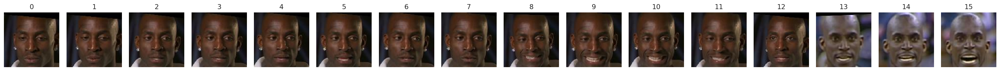

--- ORDERED BY EMBEDDING NORMS ---


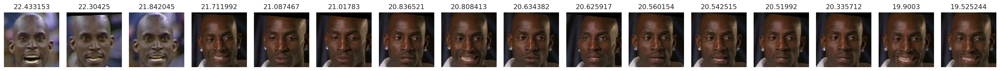

--- ORDERED BY ATTENTION VALUES ---


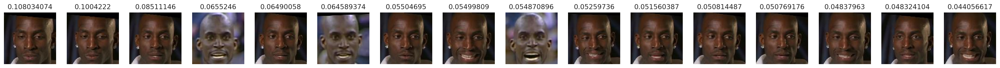

--- INITIAL SESSION ---


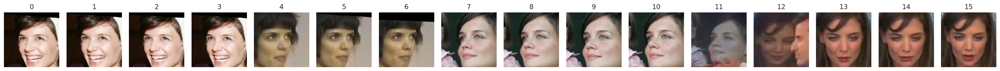

--- ORDERED BY EMBEDDING NORMS ---


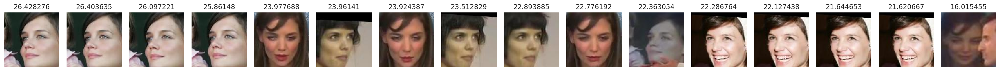

--- ORDERED BY ATTENTION VALUES ---


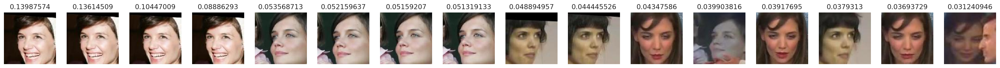

--- INITIAL SESSION ---


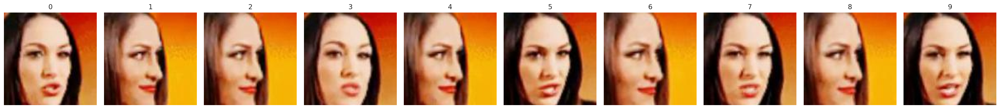

--- ORDERED BY EMBEDDING NORMS ---


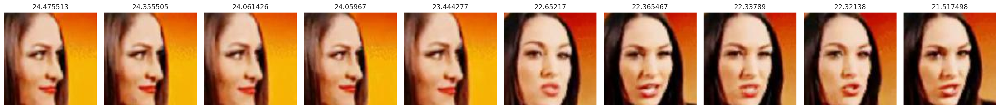

--- ORDERED BY ATTENTION VALUES ---


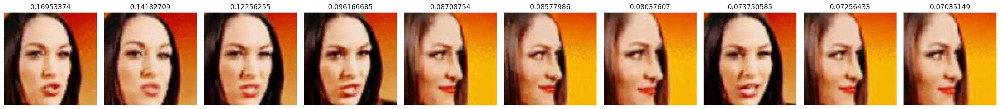

In [833]:
for i in range(3):
#     random_session_ind = np.random.randint(0, batching_parmas["num_random_sessions"])
    random_session_ind = np.random.choice(long_sequences)
    
    images , norms , attention_values  = inference_on_single_session(test_embeddings,
                                                                     test_filepathes,
                                                                   random_session_ind)
    # Filter out zero_padded embeddings for visualization
    
    non_zero_norms = np.argwhere(norms!=0).flatten()
    images = images[non_zero_norms]
    norms = norms[non_zero_norms]
    attention_values = attention_values[non_zero_norms]
    
    norm_indecies = np.argsort(norms)[::-1]
    attention_indecies = np.argsort(attention_values)[::-1]
    
    print("--- INITIAL SESSION ---")
    plot_figures(images,
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = None)
    plt.show()

    print("--- ORDERED BY EMBEDDING NORMS ---")
    plot_figures(images[norm_indecies],
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = norms[norm_indecies])
    plt.show()
    
    print("--- ORDERED BY ATTENTION VALUES ---")
    plot_figures(images[attention_indecies],
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = attention_values[attention_indecies])
    plt.show()

## With erroneously  assigned elements

In [38]:
def find_sessions_with_outliers(sessions_emb,
                                distance_thresh=.7):
    distances = []
    count_non_zero_vectors = np.sum(sessions_emb,
                                    axis=-1)
    
    mask = (count_non_zero_vectors!=0).astype(np.uint8)
    
    non_zero_per_batch = np.sum(count_non_zero_vectors!=0,
                                axis=1)
 
    prototypes = np.sum(sessions_emb,axis=1)/non_zero_per_batch[...,None]
    
    for i,session in enumerate(sessions_emb):
        distances.append(cosine_distances(session, prototypes[i].reshape(-1,
                                                                         512)))
    
    distances =  np.squeeze(np.array(distances),
                            axis=-1)*mask
    
    session_susp = np.any(distances>distance_thresh
                          , axis=1)

    return np.argwhere(session_susp)

In [39]:
# Shorter session length are chosen for visualizations
eval_gen = lambda: input_fn(input_batch_gen(identities_valid,
                                            num_of_sessions= 2048,
                                            is_sorted=batching_params['are_records_sorted'],
                                            session_len = 16,
                                            ), num_frames_per_session = 16,
                                              num_random_sessions= 2048)

test_batch = next(eval_gen().make_one_shot_iterator())
test_embeddings = test_batch[0]['embeddings']
test_filepathes = test_batch[0]['file_path']

W1121 10:30:08.894046 139792395253632 deprecation.py:323] From /usr/local/lib/python3.7/site-packages/tensorflow/python/data/ops/dataset_ops.py:494: py_func (from tensorflow.python.ops.script_ops) is deprecated and will be removed in a future version.
Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    
W1121 10:30:08.913843 139792395253632 deprecation.py:323] From <ipython-inp

In [84]:
sesssion_with_outliers = find_sessions_with_outliers(test_embeddings,
                                                     distance_thresh=.72).flatten()

--- INITIAL SESSION ---


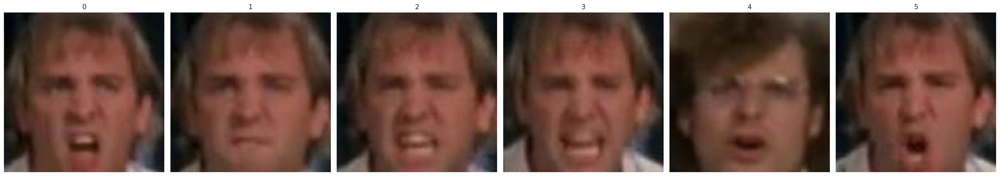

--- ORDERED BY EMBEDDING NORMS ---


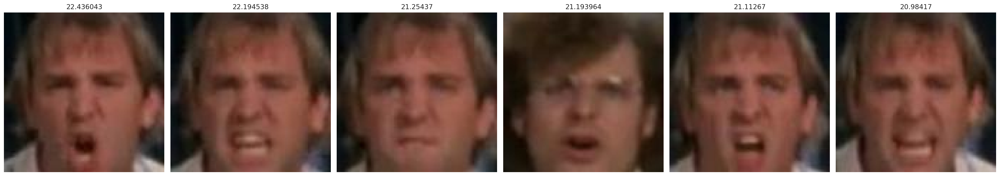

--- ORDERED BY ATTENTION VALUES ---


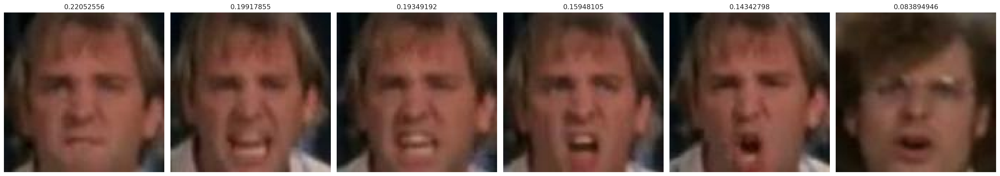

--- INITIAL SESSION ---


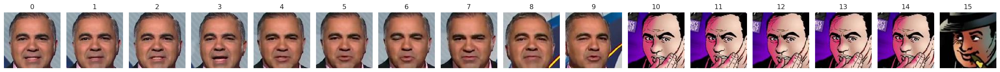

--- ORDERED BY EMBEDDING NORMS ---


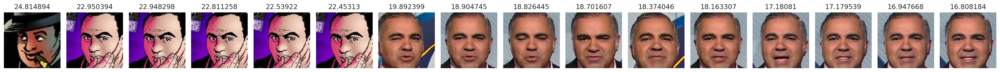

--- ORDERED BY ATTENTION VALUES ---


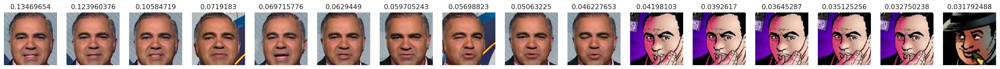

--- INITIAL SESSION ---


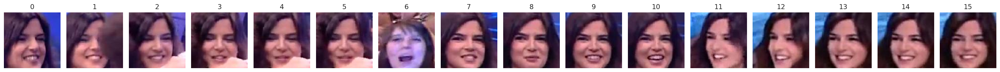

--- ORDERED BY EMBEDDING NORMS ---


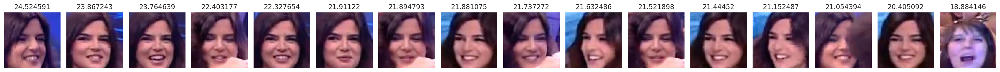

--- ORDERED BY ATTENTION VALUES ---


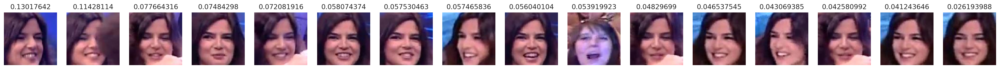

--- INITIAL SESSION ---


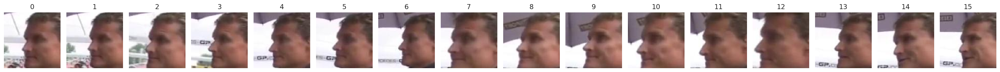

--- ORDERED BY EMBEDDING NORMS ---


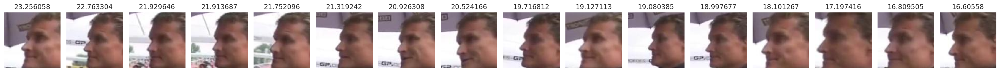

--- ORDERED BY ATTENTION VALUES ---


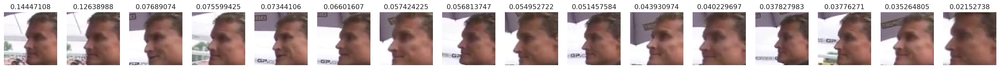

--- INITIAL SESSION ---


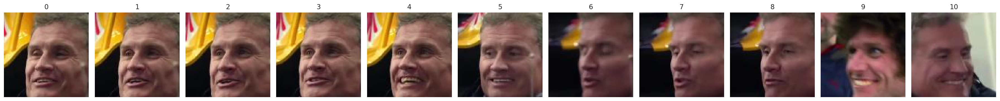

--- ORDERED BY EMBEDDING NORMS ---


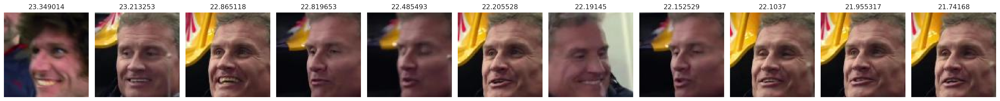

--- ORDERED BY ATTENTION VALUES ---


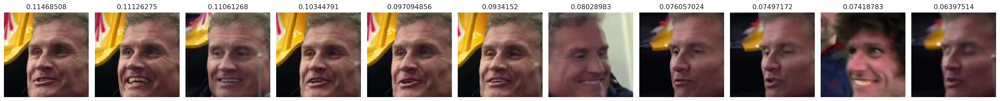

In [85]:
for i in range(5):
#     random_session_ind = np.random.randint(0, batching_parmas["num_random_sessions"])
#     random_session_ind = np.random.choice(sesssion_with_outliers,
#                                           replace=False)
    
    random_session_ind = sesssion_with_outliers[i]
    
    images , norms , attention_values  = inference_on_single_session(test_embeddings,
                                                                     test_filepathes,
                                                                   random_session_ind)
    # Filter out zero_padded embeddings for visualization
    
    non_zero_norms = np.argwhere(norms!=0).flatten()
    images = images[non_zero_norms]
    norms = norms[non_zero_norms]
    attention_values = attention_values[non_zero_norms]
    
    norm_indecies = np.argsort(norms)[::-1]
    attention_indecies = np.argsort(attention_values)[::-1]
    
    print("--- INITIAL SESSION ---")
    plot_figures(images,
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = None)
    plt.show()

    print("--- ORDERED BY EMBEDDING NORMS ---")
    plot_figures(images[norm_indecies],
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = norms[norm_indecies])
    plt.show()
    
    print("--- ORDERED BY ATTENTION VALUES ---")
    plot_figures(images[attention_indecies],
                 nrows = 1,
                 ncols = len(images),
                 figsize=(25,20),
                 titles = attention_values[attention_indecies])
    plt.show()